## Analysis of the mentorship predictions of all authors in Semantic Scholar

The purpose of the notebook is to understand and visualize the distribution of various metrics in correlation with mentorship score. This will lead to insights which might be useful for the paper.

In [14]:
import networkx as nx
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
import joblib
import argparse
from multiprocessing import Pool
import logging
import warnings
import glob
from joblib import Parallel, delayed
import collections
from collections import Counter
import seaborn as sns
import matplotlib.pyplot as plt
import ast
from numpy import arange
from IPython.display import Image
from matplotlib.pyplot import figure


logging.basicConfig(level=logging.INFO)


### Mentorship Graph:

- Nodes - `mentor` and `mentee`
- Edges - directional edges from senior author (`mentor`) to junior author (`mentee`)
- Edge weight - prediction probability for a mentor-mentee pair 
    - `mentorship_score` for that pair (`pred_prob`)
    - high edge weight means a significant mentorship relationship between the pair

A `mentor` has out edges to each `mentee`

`mentorship_score`:
- Sum of all the out edge weights of a mentor node

`mentorship_score_mean`:
- mean of all the out edge weights of a mentor node

`mentorship_score_median` :
- median of all the out edge weights of a mentor node

`mentee_count` :
- number of mentees of a mentor
- out degree of mentor node

Field of study (`fos`) :
- Field of study of the mentor


`copub_start` and `copub_end` : copublication start and end dates

`h-index` is the h-index of the mentor

In [1]:
!aws s3 cp --no-sign-request s3://ai2-s2-research-public/s2amp/inferred/mentors_s2_fos_scores.csv data/inferred/mentors_s2_fos_scores.csv

download: s3://ai2-s2-research-public/s2amp/inferred/mentors_s2_fos_scores.csv to data/inferred/mentors_s2_fos_scores.csv


In [4]:
df_mentors = pd.read_csv('data/inferred/mentors_s2_fos_scores.csv')

In [5]:
df_mentors

,authors_ai2_id,h_index,paper_count,citation_count,affiliations,mentorship_score,mentorship_score_mean,menteeship_score,menteeship_score_mean,mentee_count,mentor_count,fos,log_mentee_count
0,2562240,31,347,3730,NaN,63.163338,0.371549,0.947075,0.094707,170,10,Physics,7.409391
1,20772242,3,22,48,"[""University of Kashmir""]",0.484438,0.242219,2.146073,0.536518,2,4,Biology,1.000000
2,6402240,8,12,172,NaN,0.046127,0.046127,2.988159,0.747040,1,4,Biology,0.000000
3,48852240,6,27,62,NaN,3.916424,0.652737,0.783597,0.783597,6,1,Chemistry,2.584963
4,15018242,4,45,69,NaN,0.835011,0.139169,1.210539,0.201757,6,6,Education,2.584963
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9371015,2118403769,5,20,191,NaN,0.458033,0.229016,1.508733,0.215533,2,7,Computer Science,1.000000
9371016,2110679076,13,39,1063,"[""Novartis""]",1.726746,0.345349,4.071905,0.290850,5,14,Computer Science,2.321928
9371017,2111009961,2,6,21,NaN,0.280124,0.280124,1.832399,0.458100,1,4,Computer Science,0.000000
9371018,2109738049,15,33,1071,NaN,0.090947,0.006996,2.448788,0.204066,13,12,Computer Science,3.700440


In [27]:
df_mentors['log_paper_count'] = np.log2(df_mentors['paper_count'])
df_mentors['log_mentee_count'] = np.log2(df_mentors['mentee_count'])
df_mentors['log_mentorship_score'] = np.log2(df_mentors['mentorship_score'])
df_mentors

,authors_ai2_id,h_index,paper_count,citation_count,affiliations,mentorship_score,mentorship_score_mean,menteeship_score,menteeship_score_mean,mentee_count,mentor_count,fos,log_mentee_count,log_paper_count,log_mentorship_score
1,20772242,3,22,48,"[""University of Kashmir""]",0.484438,0.242219,2.146073,0.536518,2,4,Biology,1.000000,4.459432,-1.045616
11,48066037,18,34,1371,"[""National Oceanic and Atmospheric Administrat...",4.291547,0.119210,3.209053,0.076406,36,42,Environmental Science,5.169925,5.087463,2.101498
17,47034244,2,6,45,"[""Department of Neurosurgery, Langone Medical ...",0.001170,0.001170,0.973493,0.486746,1,2,Medicine,0.000000,2.584963,-9.738814
20,3828124,24,77,2271,"[""Wageningen Livestock Research, Wageningen Un...",6.926855,0.197910,5.596166,0.215237,35,26,Biology,5.129283,6.266787,2.792201
23,37392125,8,16,221,"[""Electrical Engineering Department, Universit...",0.001532,0.001532,3.536715,0.176836,1,20,Physics,0.000000,4.000000,-9.350735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9371007,2108350249,13,88,517,"[""School of Electrical and Electronic Engineer...",13.970785,0.465693,0.677527,0.135505,30,5,Engineering,4.906891,6.459432,3.804341
9371008,2109038747,6,8,353,"[""Imperial College London, Max Planck Society,...",0.087689,0.087689,2.002082,0.400416,1,5,Biology,0.000000,3.000000,-3.511462
9371010,2116414420,3,16,32,"[""Dept. of Math., Manav Rachna Int. Univ., Far...",0.560718,0.280359,0.593263,0.593263,2,1,Medicine,1.000000,4.000000,-0.834653
9371013,2117870253,4,7,32,"[""Georgetown University""]",0.066293,0.066293,1.489009,0.372252,1,4,Computer Science,0.000000,2.807355,-3.914993


### Examining some authors for sanity check

Trying to find the actual profiles of the mentors identified with really high scores according to our model.

Looking at the graph below(for different feild of studies) and searching for the actual authors -

In [16]:
fig = px.scatter(df_mentors.sample(n=100000, random_state=2), 
                 x="mentorship_score", 
                 y="h_index", 
                 color="fos",
                 hover_data=['authors_ai2_id'])
fig.show()

Author profile (Chemistry) 

- Name : Leo Paquette
- Semantic scholar home page : https://www.semanticscholar.org/author/L.-Paquette/94245449
- Wikipedia : https://en.wikipedia.org/wiki/Leo_Paquette
- Mentorship score : 272.44

**"Paquette had authored more than 1000 papers, 38 book chapters, and 17 books, and had guided approximately 150 graduate students to their Ph.D. degrees." - Wikipedia**

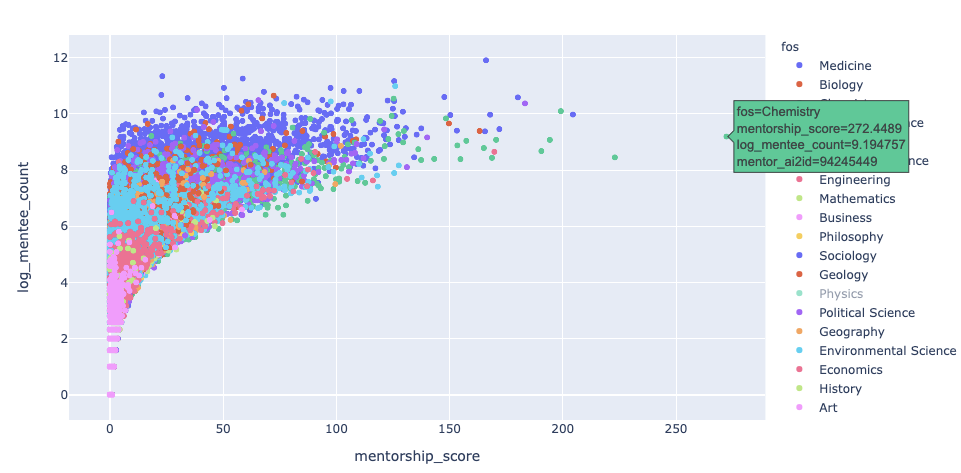

In [5]:
Image(filename = "chemistry.png")

Author profile (Medicine) 

- Name : Yuen Kwok-yung
- Semantic scholar home page : https://www.semanticscholar.org/author/K.-Yuen/145537748
- Wikipedia : https://en.wikipedia.org/wiki/Yuen_Kwok-yung
- Mentorship score : 204.6

**"He led a team identifying the SARS coronavirus that caused the SARS pandemic of 2003–4, and traced its genetic origins to wild bats. During the ongoing COVID-19 pandemic, he has acted as expert adviser to the Hong Kong government." - Wikipedia**

In [10]:
fig = px.scatter(df_mentors.sample(n=100000, random_state=2)[df_mentors['fos']=='Medicine'], 
                 x="mentorship_score", 
                 y="h_index", 
                 color="fos",
                 hover_data=['authors_ai2_id'])
fig.show()

/net/nfs2.s2-research/shaurya/sw/miniconda3/envs/scrapy/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Author profile (Economics) 

- Name : Peter Nijkamp
- Semantic scholar home page : https://www.semanticscholar.org/author/P.-Nijkamp/2965486
- Wikipedia : https://en.wikipedia.org/wiki/Peter_Nijkamp
- Mentorship score : 169.8

**"He is ranked among the top 100 economists[1] in the world according to IDEAS/RePEc, and is by far the most prolific economist" - Wikipedia**

In [12]:
fig = px.scatter(df_mentors.sample(n=100000, random_state=2)[df_mentors['fos']=='Economics'], 
                 x="mentorship_score", 
                 y="log_mentee_count", 
                 color="fos",
                 hover_data=['authors_ai2_id'])
fig.show()

/net/nfs2.s2-research/shaurya/sw/miniconda3/envs/scrapy/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Author profile (Computer Science - Electrical Engineering) 

- Name : Kaushik Roy 
- Semantic scholar home page : https://www.semanticscholar.org/author/K.-Roy/143884690
- Wikipedia : https://en.wikipedia.org/wiki/Kaushik_Roy
- Mentorship score : 127.2

**"He has supervised 91 Ph.D. dissertations and co-authored two books on Low Power CMOS VLSI Design (John Wiley & McGraw Hill)" - Wikipedia**

### It looks like the model is learning something and is actually able to identify the prominent contributers in an area. 

## Correlation with other author metrics

Lets look at the correlation between other author metrics and mentorship score.

<AxesSubplot:>

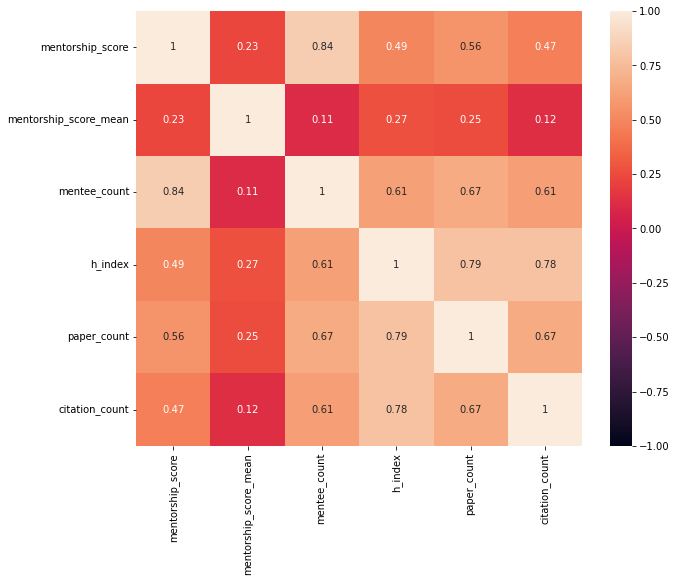

In [17]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_mentors[['mentorship_score', 'mentorship_score_mean',
       'mentee_count', 'h_index', 'paper_count',
       'citation_count']].corr(), vmin=-1, vmax=1, annot=True)

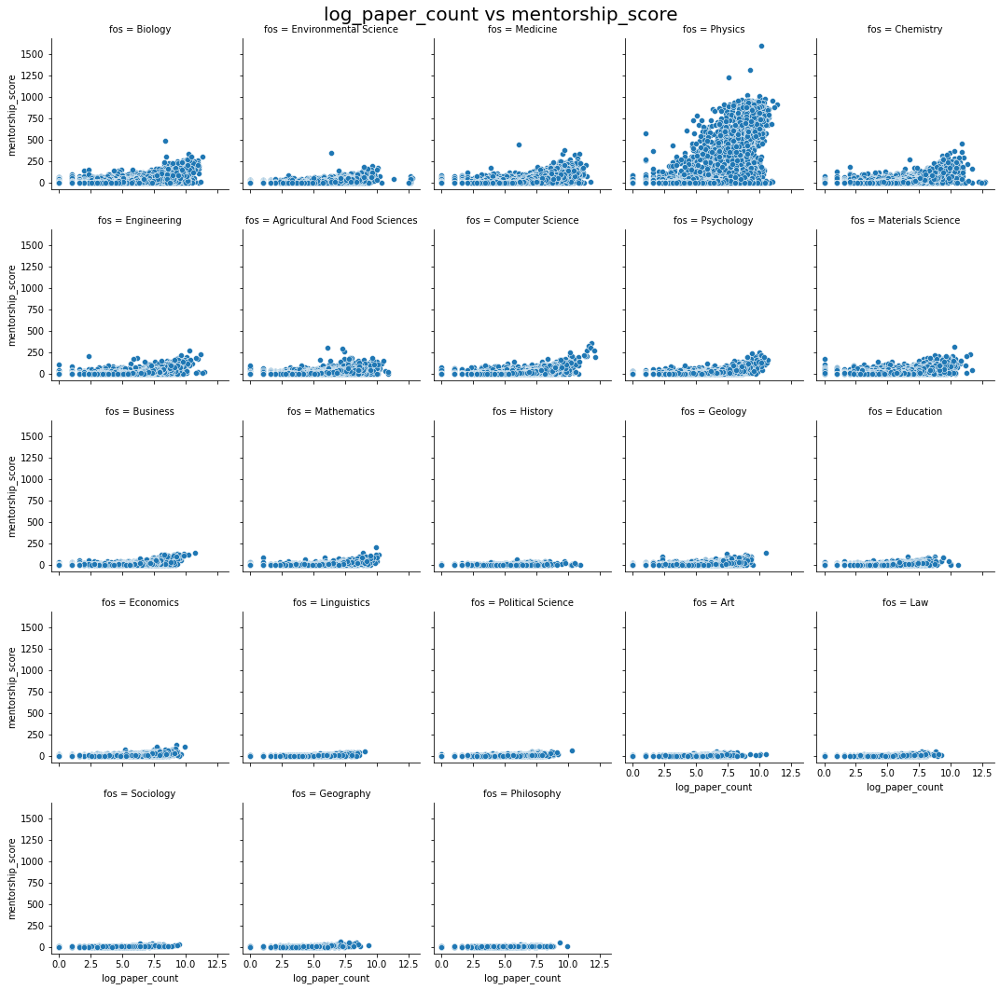

In [24]:
g = sns.FacetGrid(df_mentors, col="fos",col_wrap=5)
g.fig.suptitle('log_paper_count vs mentorship_score', fontsize=20)
g.map(sns.scatterplot, "log_paper_count", "mentorship_score")

### In which field of study mentorship scores are marginally different from others?

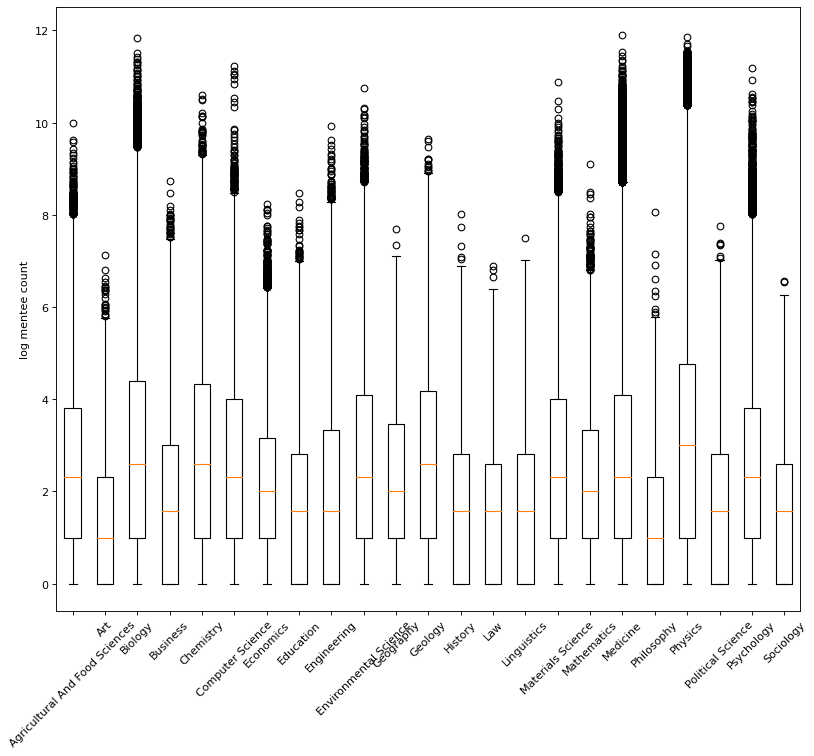

In [23]:
df_mentee_count = (
        df_mentors.groupby("fos")["log_mentee_count"]
        .apply(list)
        .reset_index(name="mentee_count_list")
    )

dict_count = df_mentee_count.set_index('fos')['mentee_count_list'].to_dict()
figure(figsize=(12, 10), dpi=80)
labels, data = [*zip(*dict_count.items())]  

labels, data = dict_count.keys(), dict_count.values()

plt.boxplot(data)
plt.xticks(range(1, len(labels) + 1), labels, rotation = 45)
plt.ylabel('log mentee count')
plt.show()

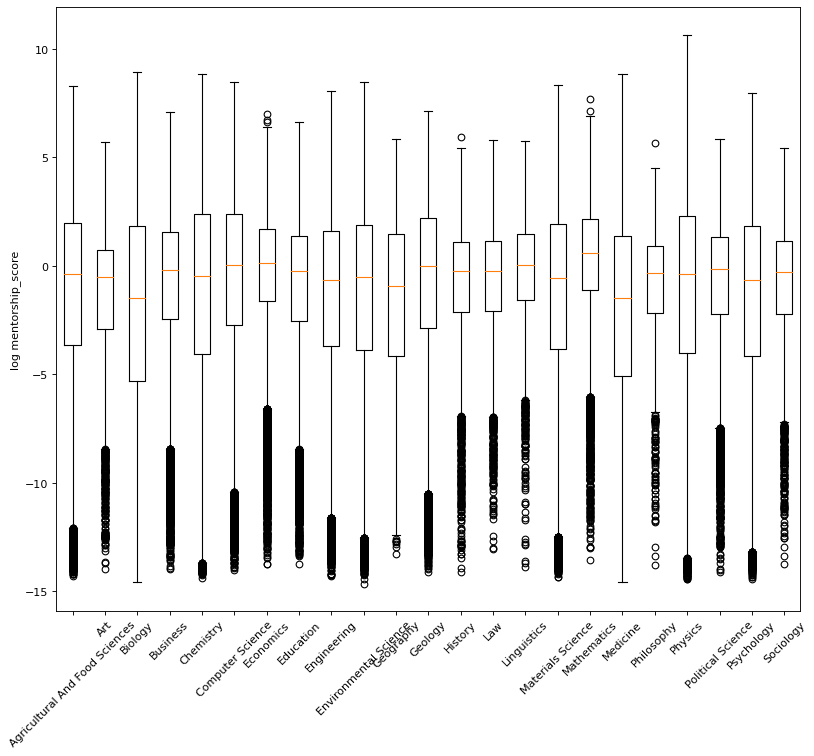

In [28]:
df_mentee_count = (
        df_mentors.groupby("fos")["log_mentorship_score"]
        .apply(list)
        .reset_index(name="log_mentorship_score_list")
    )

dict_count = df_mentee_count.set_index('fos')['log_mentorship_score_list'].to_dict()
figure(figsize=(12, 10), dpi=80)
labels, data = [*zip(*dict_count.items())]  

labels, data = dict_count.keys(), dict_count.values()

plt.boxplot(data)
plt.xticks(range(1, len(labels) + 1), labels, rotation = 45)
plt.ylabel('log mentorship_score')
plt.show()

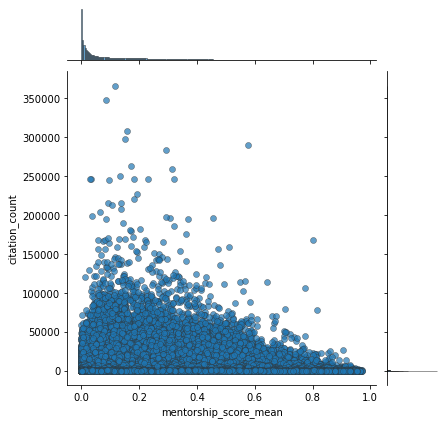

In [34]:
g = sns.JointGrid(data=df_mentors, x="mentorship_score_mean", y="citation_count")
g.plot(sns.scatterplot, sns.histplot, alpha=.7, edgecolor=".2", linewidth=.5)